this code looks in atmmodel.csv, finds unique POB information, opens corresponding hdf files and visualizes POB imgaes based on selected POB infor from atmmodel.csv

needs MTK so use it with python-3.6

In [1]:
import MisrToolkit as Mtk
from MisrToolkit import *
import os
import pandas as pd
import numpy as np
from matplotlib import image as pltimg, pyplot as plt  #  pyplot uses the actual RGB values as they are, more accurate than PIL


In [2]:
def find_unique_pob(atmmodel_file_fp, list_of_columns):
    
    print('input file found: %s' %(os.path.isfile(atmmodel_file_fp)))
    in_csv_df = pd.read_csv(atmmodel_file_fp)
    print(in_csv_df.columns)
    pob_unique = in_csv_df.drop_duplicates(subset=list_of_columns, keep='first', ignore_index=False)
    pob_unique.info()
    
    return pob_unique

In [3]:
# from matplotlib import image as pltimg, pyplot as plt  #  pyplot uses the actual RGB values as they are, more accurate than PIL

def plot_here_and_write(in_arr, img_dir, start_blk, end_blk):
    write_mode = 0
    
    %matplotlib inline 
    plt.gray() # This will show the images in grayscale as default
    plt.figure(figsize=(30,30))  # set the figure size
    plt.imshow(in_arr)
    plt.show()
    
#     if (write_mode):
#             img_label = 'path_'+path_num+'_'+'blocks_'+str(start_blk)+'_'+str(end_blk)+'_cam_'+cam
#             img_format = ".jpg"
#         print('save mode: on, we write images to disc')
        
#         out_img = img_label+img_format
#         out_img_fullpath = os.path.join(img_dir, out_img)
#         print("-> output img is: %s" %out_img_fullpath)
#         pltimg.imsave(out_img_fullpath, in_arr)
#         #     plt.savefig(out_img)
    
    return 0


In [4]:
hdf_dir = "/Volumes/Ehsan-7757225325/2016/april_2016/hdf_files_on_PH/hdf_inrange_15_30_april2016"

# hdf_dir = "/Volumes/Ehsan-7757225325/2016/july_2016/ellipsoid_files/elliposid_files_used_for_mapping"

os.path.isdir(hdf_dir)

True

In [5]:
# atmmodel_csv = 'atmmodel_july_2016_1to16.csv'
# home_dir = '/Users/ehsanmos/MLP_dataset/july_2016'

# april
atmmodel_csv = 'atmmodel_april_2016_k_zero.csv'
home_dir = "/Users/ehsanmos/MLP_dataset/atmmodel_k_zero"


# july
# atmmodel_csv = 'atmmodel_july_2016_1to16.csv'
# home_dir = '/Users/ehsanmos/MLP_dataset/july_2016'


in_csv = os.path.join(home_dir, atmmodel_csv)
print(os.path.isfile(in_csv))

True


## plot images using atmmodel.csv 

In [8]:
# find unique POB in atmmodel.csv 

list_of_cols = ['#path',' orbit', ' img_block']
# list_of_cols = ['path','orbit', 'block']

pob_unique = find_unique_pob(in_csv, list_of_cols)
print(pob_unique.shape)

input file found: True
Index(['#path', ' orbit', ' img_block', ' line', ' sample', ' firstLat',
       ' firstLon', ' an', ' ca', ' cf', ' rms', ' weight', ' npts', ' cloud',
       ' var'],
      dtype='object')
<class 'pandas.core.frame.DataFrame'>
Int64Index: 60 entries, 0 to 42975
Data columns (total 15 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   #path       60 non-null     int64  
 1    orbit      60 non-null     int64  
 2    img_block  60 non-null     int64  
 3    line       60 non-null     int64  
 4    sample     60 non-null     int64  
 5    firstLat   60 non-null     float64
 6    firstLon   60 non-null     float64
 7    an         60 non-null     float64
 8    ca         60 non-null     float64
 9    cf         60 non-null     float64
 10   rms        60 non-null     float64
 11   weight     60 non-null     float64
 12   npts       60 non-null     float64
 13   cloud      60 non-null     int64  
 14   var        60 non-n

In [10]:
print(pob_unique.head())


     #path   orbit   img_block   line   sample   firstLat    firstLon  \
0      161   86908           6    427     1394  71.773419  205.988687   
56      79   86932          31    417     1371  72.109520  210.452464   
245     90   86889          16    455     1540  79.907788  273.201025   
455    106   86890          13    476      724  79.833672  273.193115   
526    106   86890          14      0      621  79.962623  273.206914   

           an        ca         cf        rms   weight   npts   cloud  \
0    4.883254  8.022488  16.350180  14.200000      1.0    4.0      -1   
56   0.735176  0.838593   0.864487  25.555000      1.0    2.0      -1   
245  0.696983  0.795200   1.153750   7.837606      1.0   71.0      -1   
455  0.618979  0.773878   1.058473   8.145106      1.0   47.0      -1   
526  0.615913  0.760476   1.116418   7.923976      1.0   83.0      -1   

          var  
0    1.277087  
56   1.515000  
245  0.793014  
455  0.580033  
526  0.629197  


## write out the unique POB info to a file

In [13]:
# output_dir = home_dir
# output_filename = 'uniques_pob_withATMinThem_from_atmmodel.csv'

# pob_unique[['#path',' orbit',' img_block']].to_csv(os.path.join(output_dir, output_filename), index=False)

## check/visualize unique images in a loop

P=161, O=86908, B=6, points-per-pixel= 4.0


<Figure size 432x288 with 0 Axes>

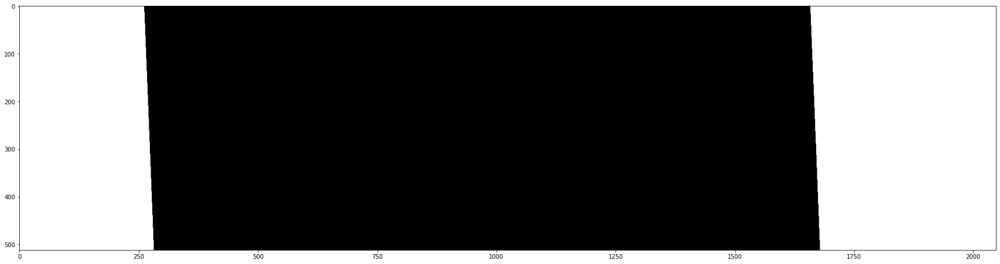

P=079, O=86932, B=31, points-per-pixel= 2.0


<Figure size 432x288 with 0 Axes>

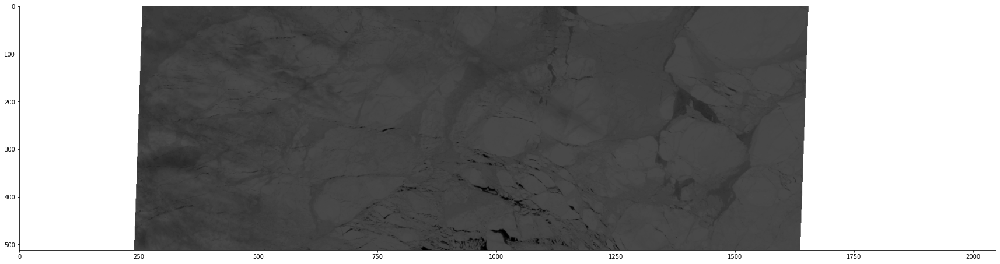

P=090, O=86889, B=16, points-per-pixel= 71.0


<Figure size 432x288 with 0 Axes>

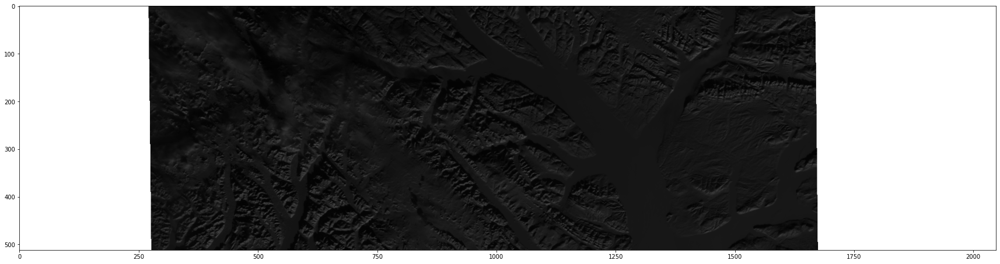

P=106, O=86890, B=13, points-per-pixel= 47.0


<Figure size 432x288 with 0 Axes>

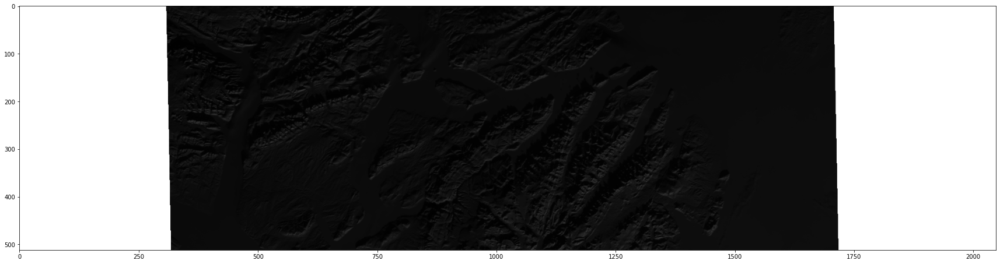

P=106, O=86890, B=14, points-per-pixel= 83.0


<Figure size 432x288 with 0 Axes>

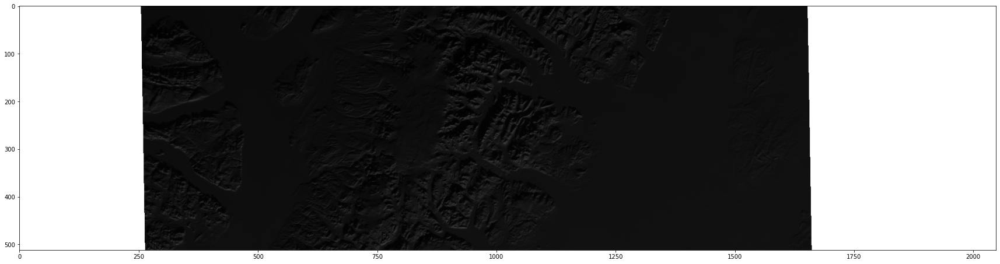

P=049, O=86901, B=25, points-per-pixel= 54.0


<Figure size 432x288 with 0 Axes>

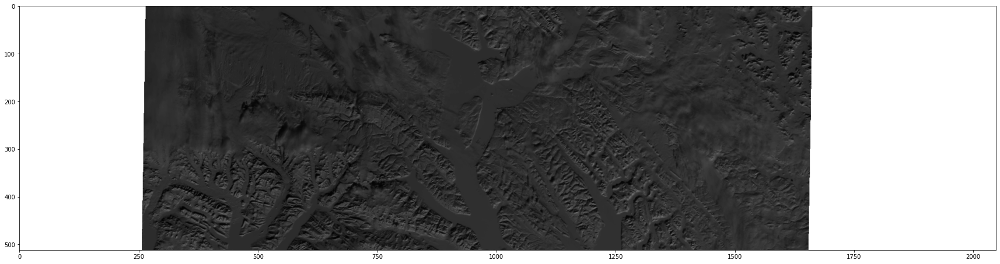

P=049, O=86901, B=24, points-per-pixel= 86.0


<Figure size 432x288 with 0 Axes>

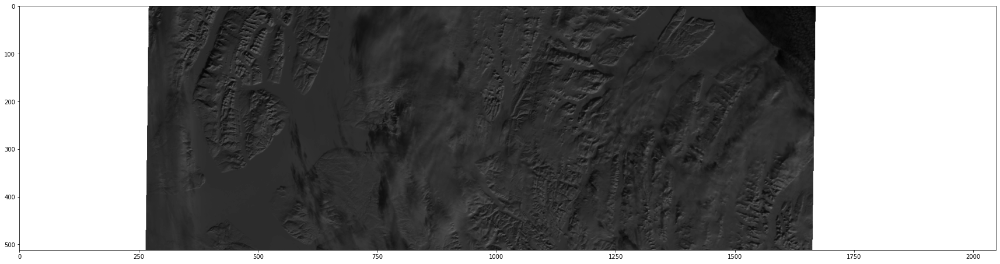

P=065, O=86902, B=22, points-per-pixel= 74.0


<Figure size 432x288 with 0 Axes>

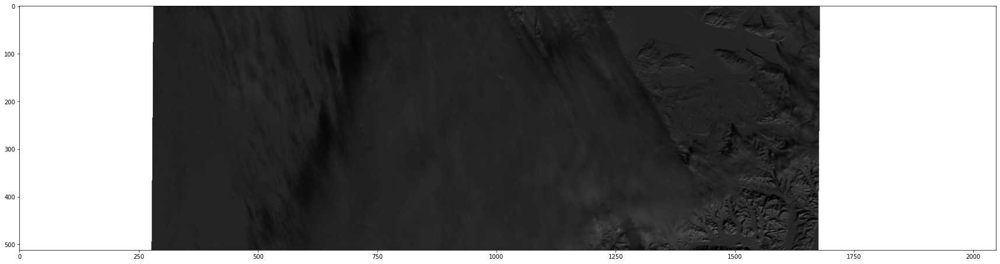

P=097, O=86904, B=15, points-per-pixel= 73.0


<Figure size 432x288 with 0 Axes>

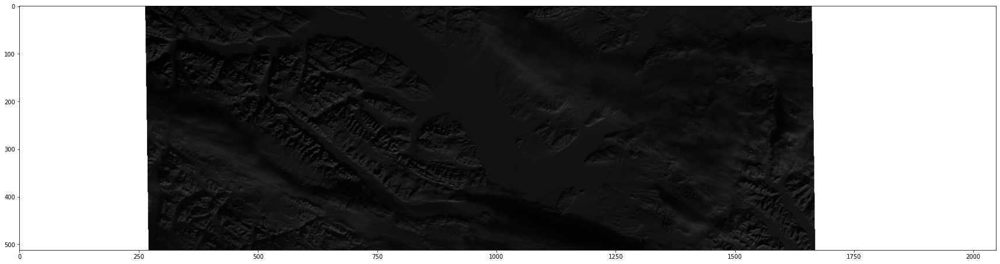

P=152, O=86922, B=6, points-per-pixel= 2.0


<Figure size 432x288 with 0 Axes>

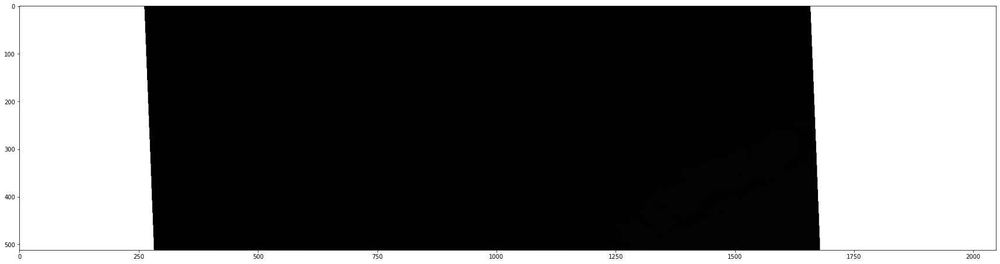

P=090, O=86889, B=17, points-per-pixel= 62.0


<Figure size 432x288 with 0 Axes>

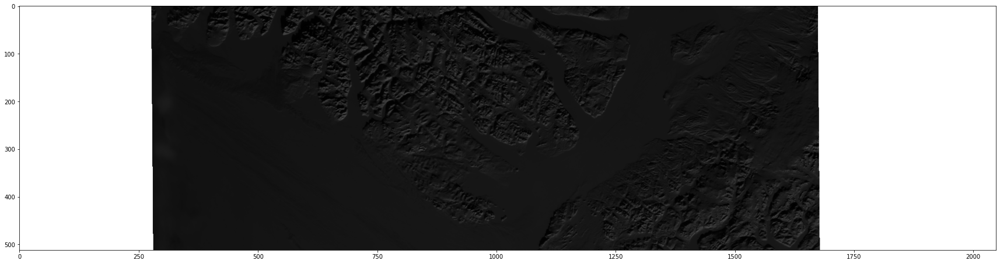

P=081, O=86903, B=18, points-per-pixel= 70.0


<Figure size 432x288 with 0 Axes>

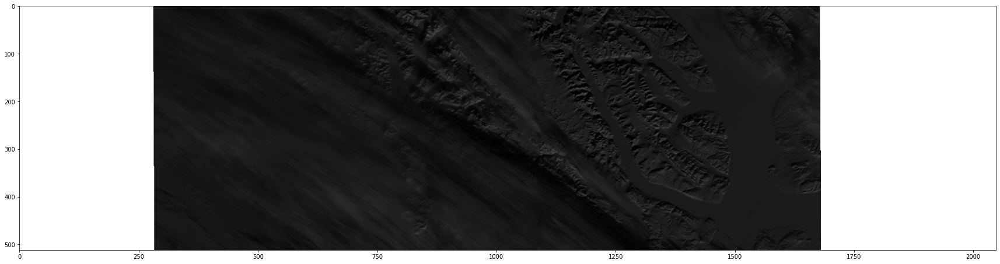

P=097, O=86904, B=25, points-per-pixel= 3.0


<Figure size 432x288 with 0 Axes>

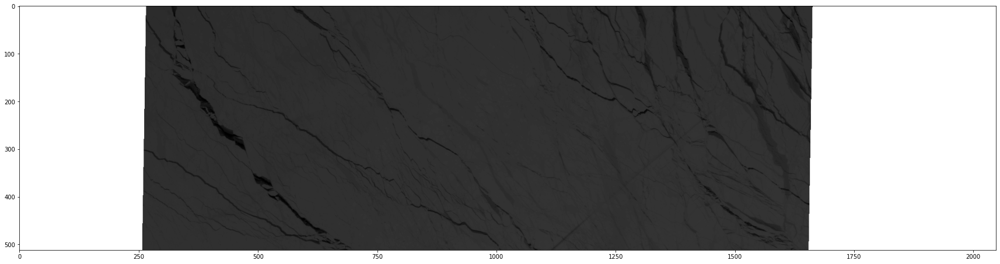

P=145, O=86907, B=14, points-per-pixel= 9.0


<Figure size 432x288 with 0 Axes>

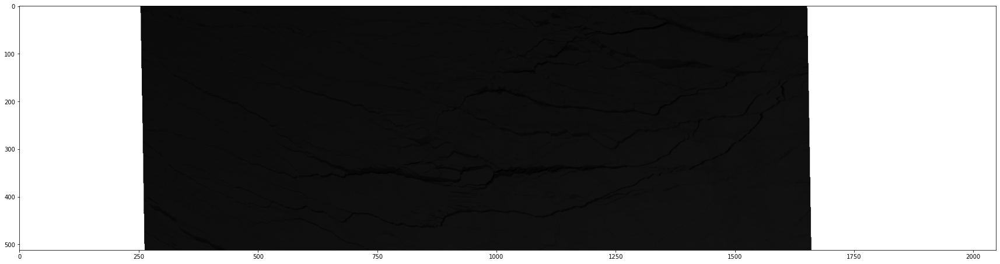

P=088, O=86918, B=27, points-per-pixel= 1.0


<Figure size 432x288 with 0 Axes>

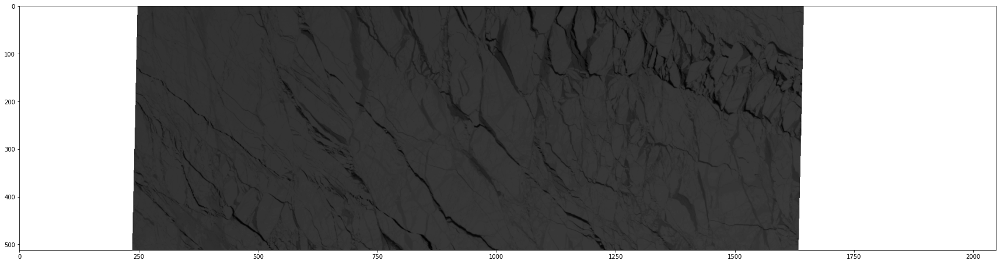

P=097, O=86904, B=26, points-per-pixel= 10.0


<Figure size 432x288 with 0 Axes>

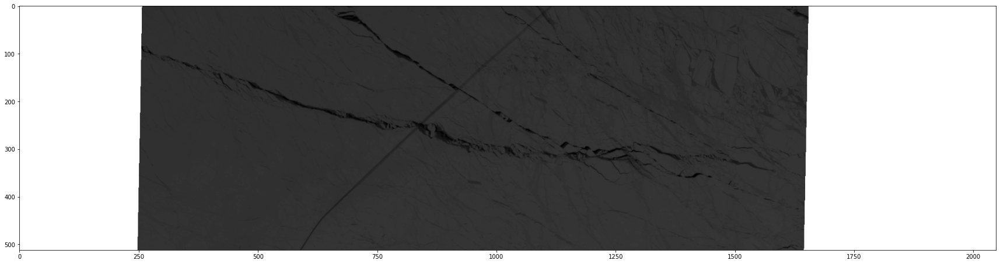

P=161, O=86908, B=11, points-per-pixel= 2.0


<Figure size 432x288 with 0 Axes>

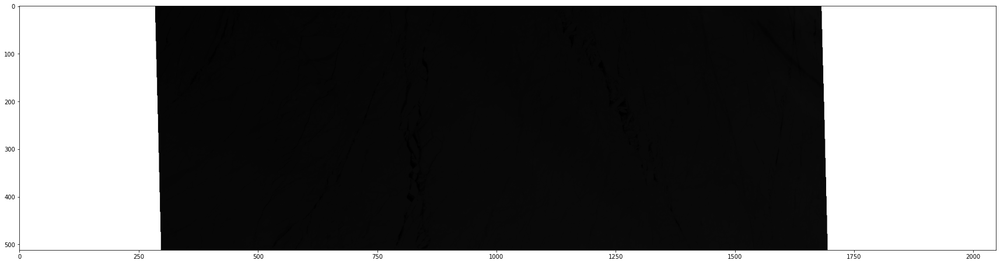

P=097, O=86904, B=23, points-per-pixel= 8.0


<Figure size 432x288 with 0 Axes>

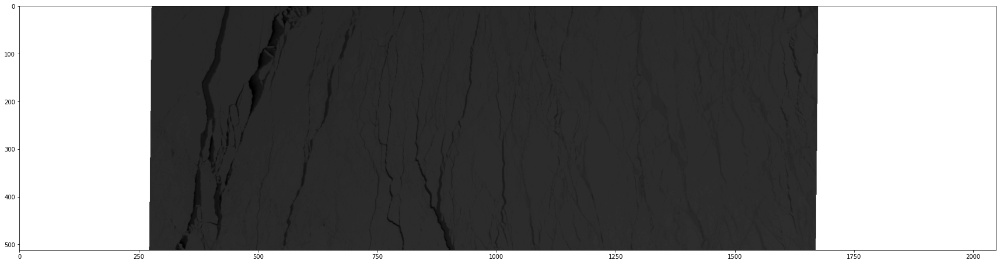

P=113, O=86905, B=20, points-per-pixel= 6.0


<Figure size 432x288 with 0 Axes>

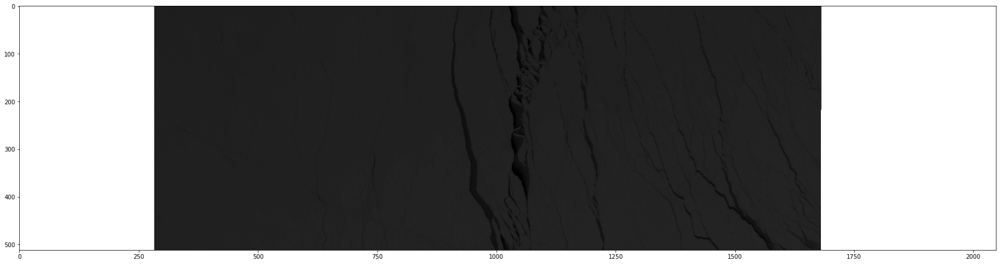

P=113, O=86905, B=21, points-per-pixel= 11.0


<Figure size 432x288 with 0 Axes>

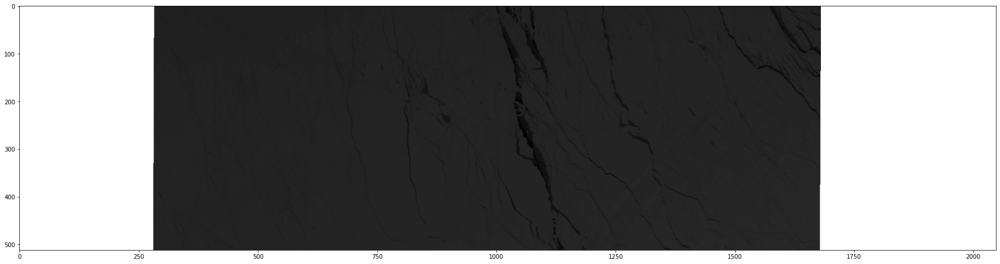

P=129, O=86906, B=17, points-per-pixel= 3.0


<Figure size 432x288 with 0 Axes>

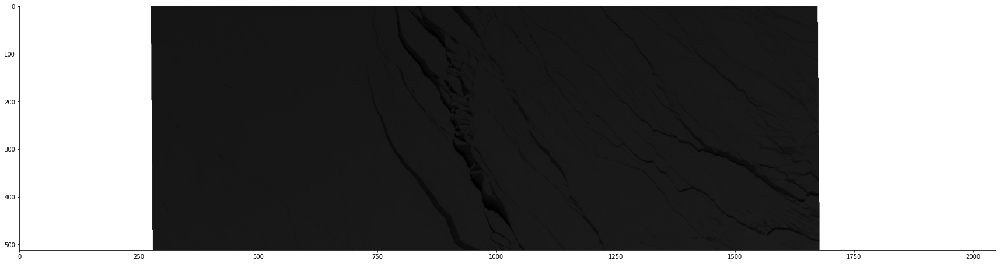

P=145, O=86907, B=15, points-per-pixel= 8.0


<Figure size 432x288 with 0 Axes>

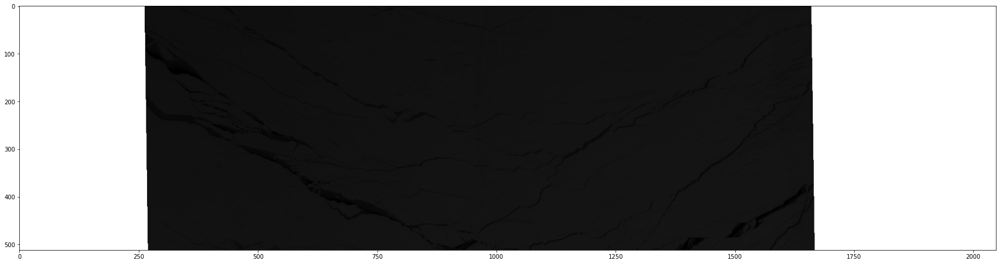

P=096, O=87035, B=19, points-per-pixel= 1.0


<Figure size 432x288 with 0 Axes>

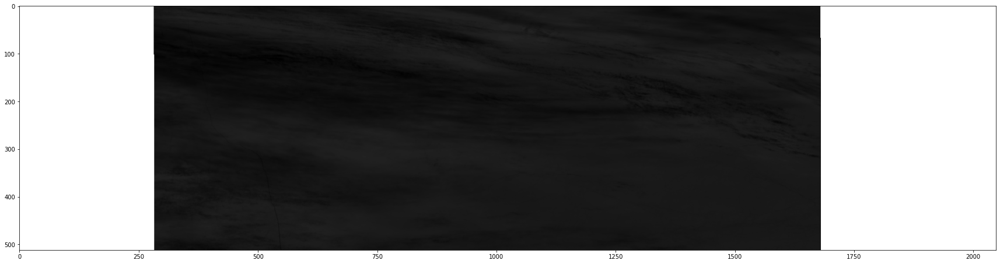

P=112, O=87036, B=16, points-per-pixel= 1.0


<Figure size 432x288 with 0 Axes>

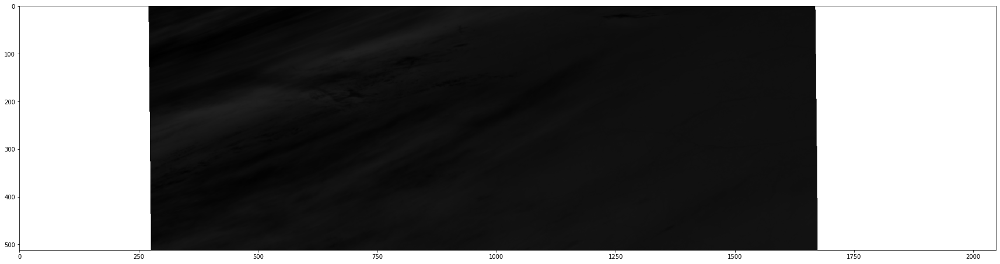

P=087, O=87049, B=21, points-per-pixel= 3.0


<Figure size 432x288 with 0 Axes>

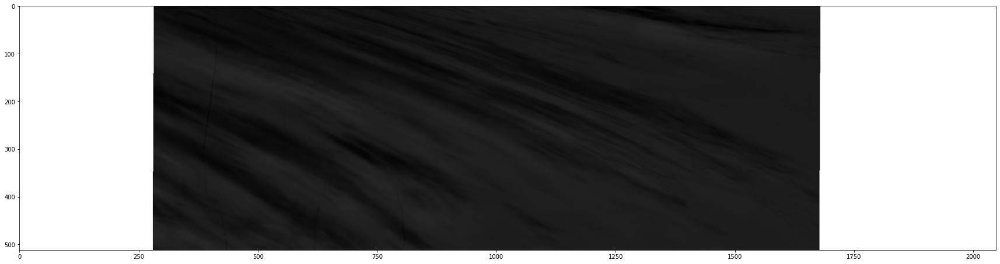

P=079, O=86932, B=32, points-per-pixel= 8.0


<Figure size 432x288 with 0 Axes>

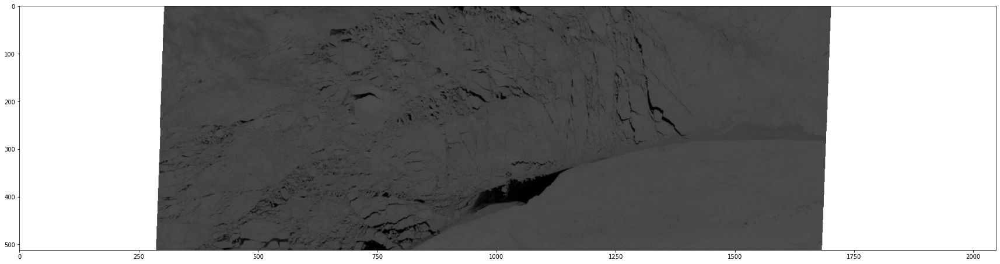

P=161, O=86908, B=10, points-per-pixel= 1.0


<Figure size 432x288 with 0 Axes>

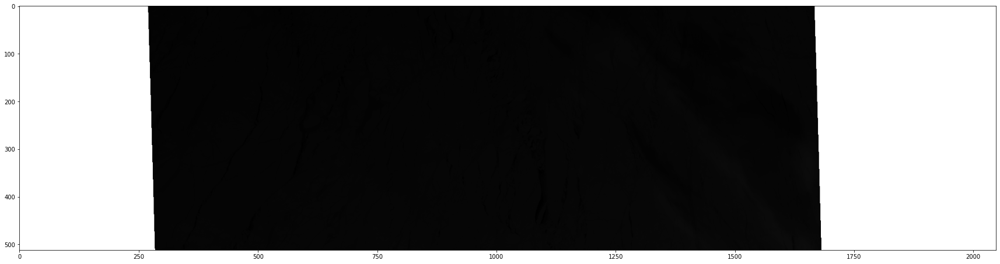

P=088, O=86918, B=28, points-per-pixel= 1.0


<Figure size 432x288 with 0 Axes>

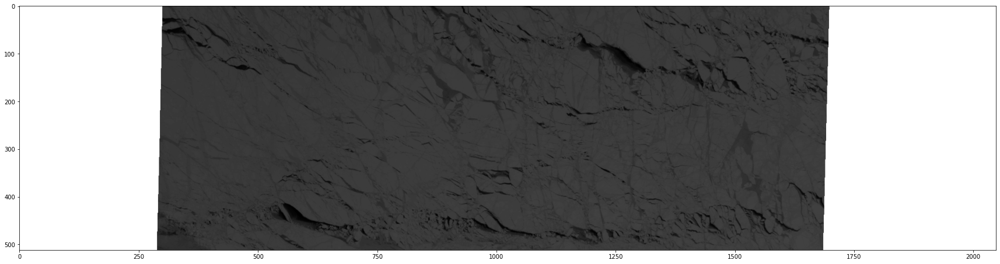

P=079, O=86932, B=30, points-per-pixel= 8.0


<Figure size 432x288 with 0 Axes>

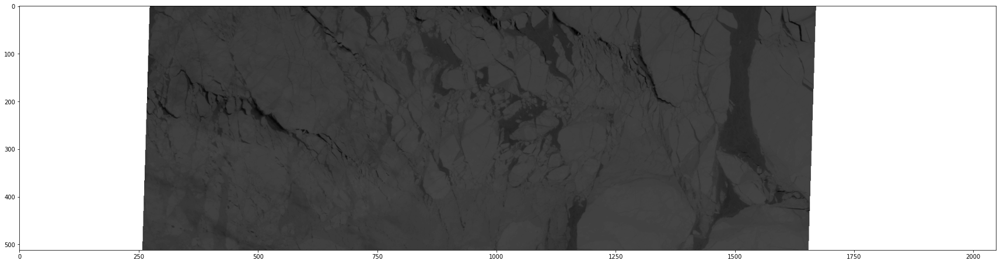

P=161, O=86908, B=8, points-per-pixel= 6.0


<Figure size 432x288 with 0 Axes>

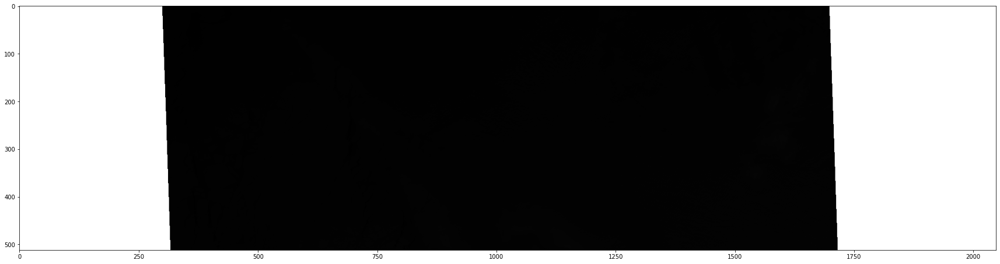

P=161, O=86908, B=7, points-per-pixel= 10.0


<Figure size 432x288 with 0 Axes>

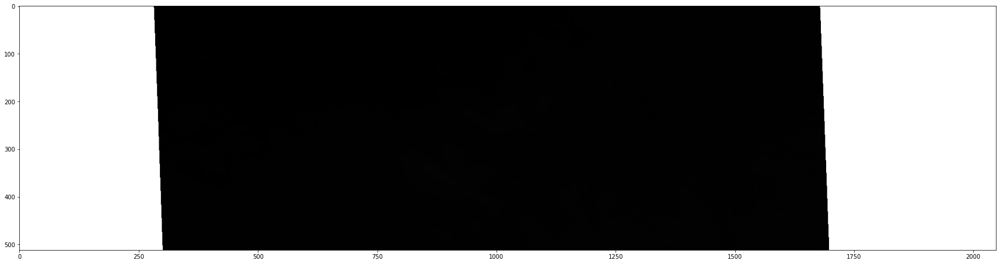

P=161, O=86908, B=9, points-per-pixel= 7.0


<Figure size 432x288 with 0 Axes>

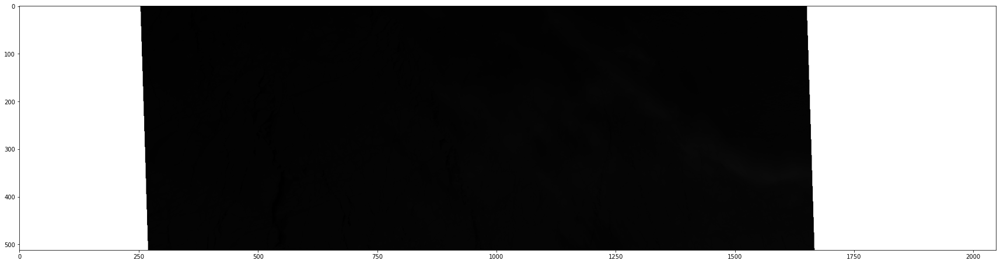

P=088, O=86918, B=29, points-per-pixel= 3.0


<Figure size 432x288 with 0 Axes>

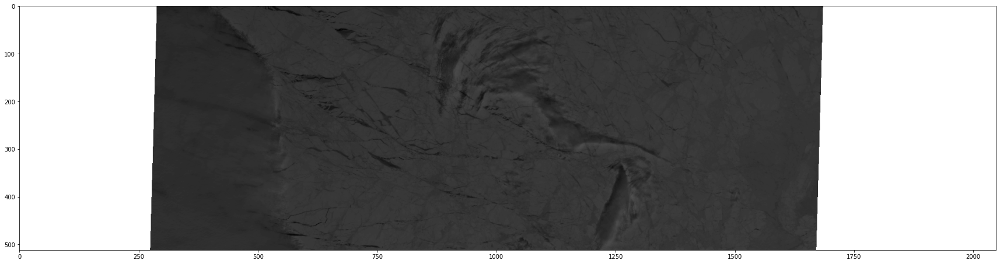

P=128, O=87037, B=13, points-per-pixel= 8.0


<Figure size 432x288 with 0 Axes>

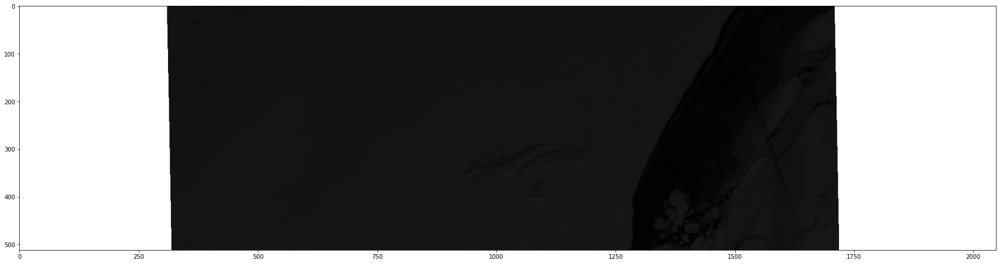

P=071, O=87048, B=26, points-per-pixel= 7.0


<Figure size 432x288 with 0 Axes>

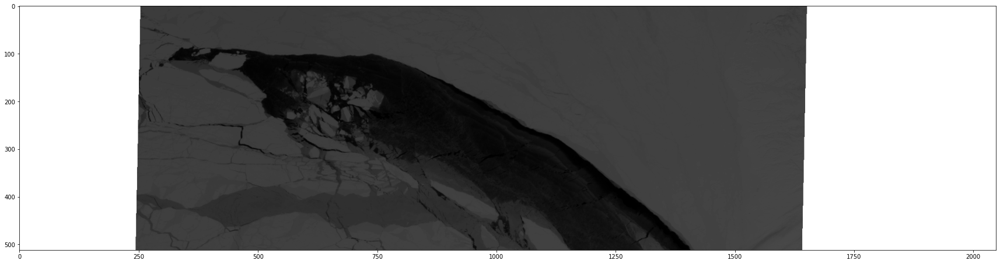

P=113, O=86905, B=19, points-per-pixel= 4.0


<Figure size 432x288 with 0 Axes>

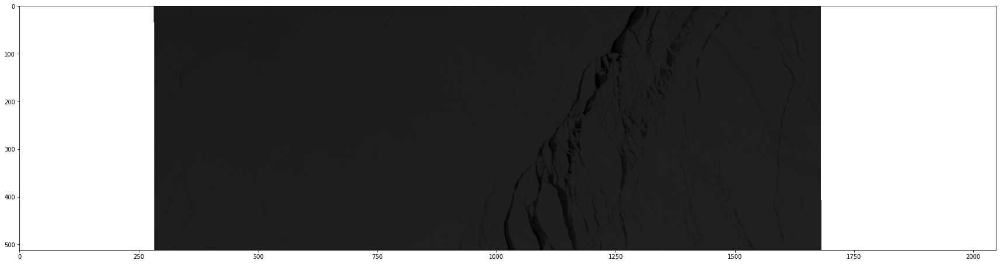

P=065, O=86902, B=21, points-per-pixel= 2.0


<Figure size 432x288 with 0 Axes>

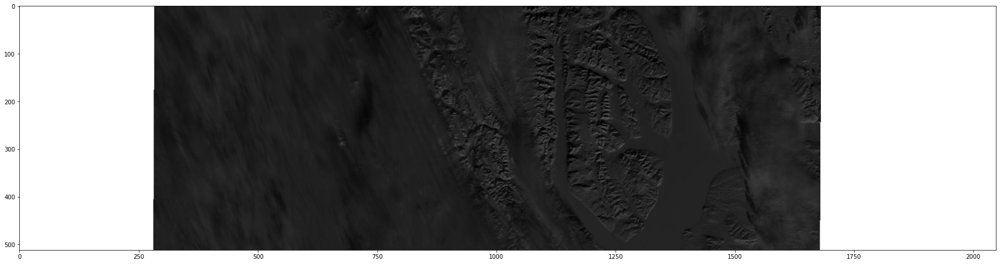

P=144, O=87038, B=10, points-per-pixel= 4.0


<Figure size 432x288 with 0 Axes>

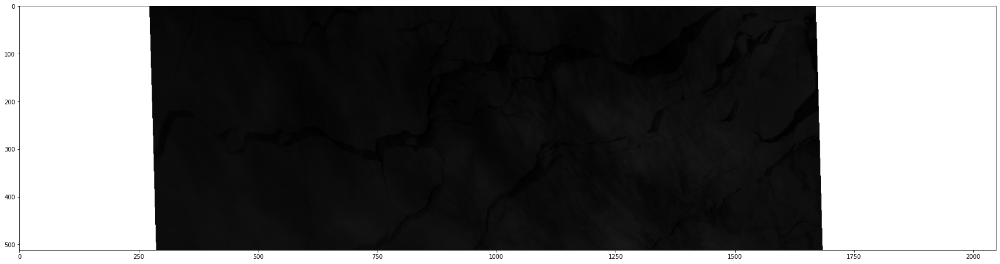

P=071, O=87048, B=28, points-per-pixel= 5.0


<Figure size 432x288 with 0 Axes>

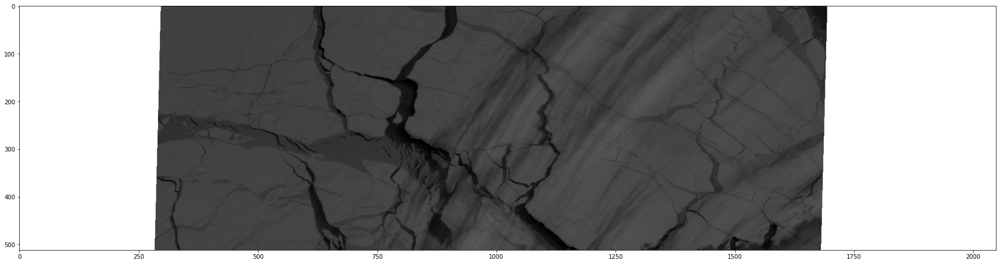

P=071, O=87048, B=27, points-per-pixel= 9.0


<Figure size 432x288 with 0 Axes>

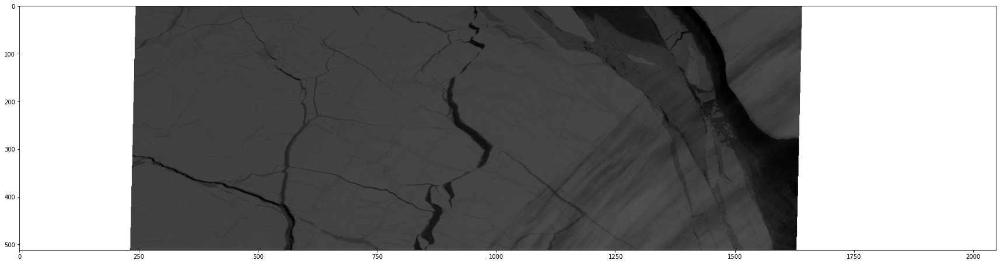

P=152, O=86922, B=7, points-per-pixel= 6.0


<Figure size 432x288 with 0 Axes>

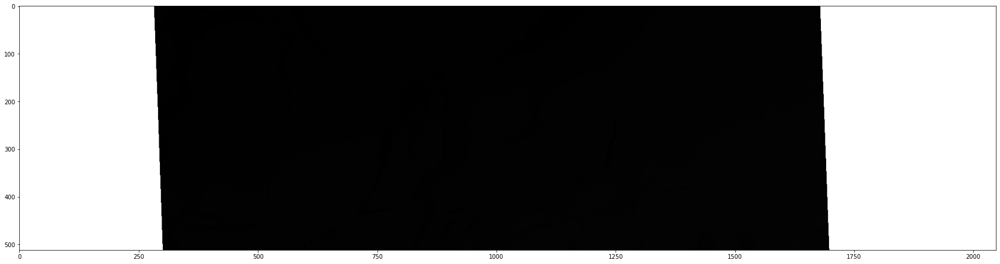

P=152, O=86922, B=8, points-per-pixel= 7.0


<Figure size 432x288 with 0 Axes>

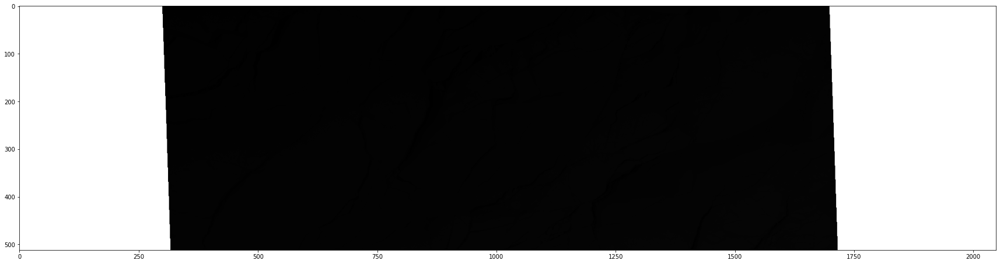

P=144, O=87038, B=9, points-per-pixel= 7.0


<Figure size 432x288 with 0 Axes>

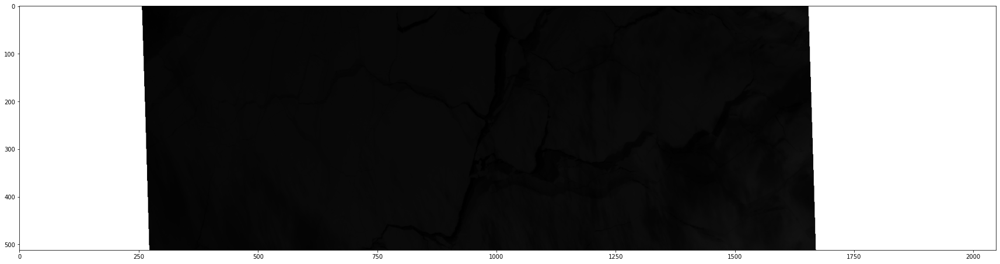

P=071, O=87048, B=29, points-per-pixel= 6.0


<Figure size 432x288 with 0 Axes>

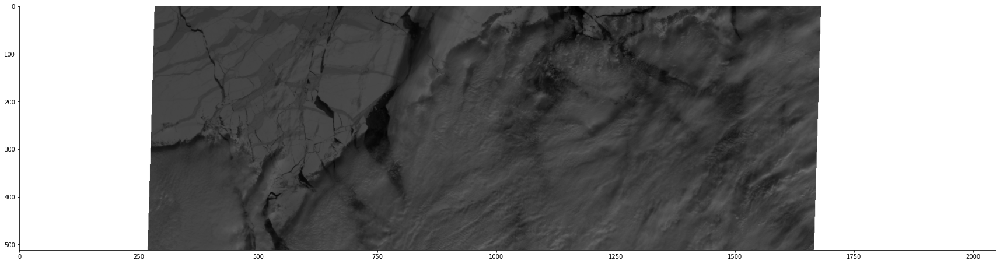

P=087, O=87049, B=20, points-per-pixel= 1.0


<Figure size 432x288 with 0 Axes>

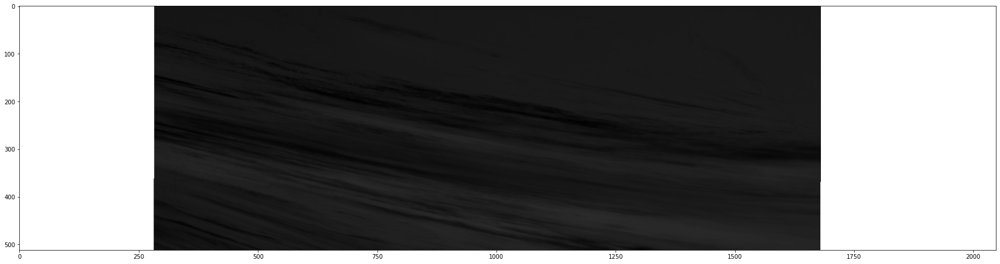

P=152, O=86922, B=9, points-per-pixel= 1.0


<Figure size 432x288 with 0 Axes>

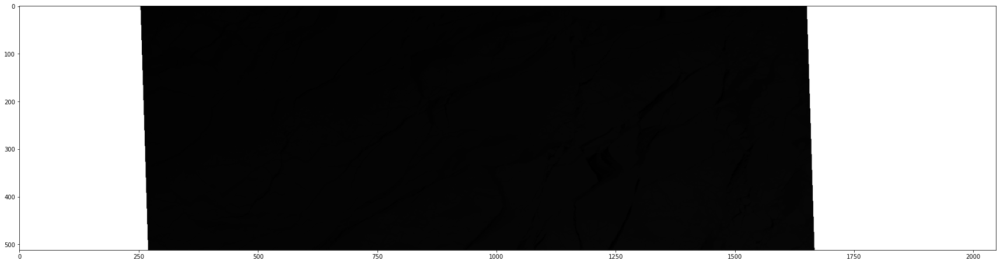

P=079, O=86932, B=29, points-per-pixel= 8.0


<Figure size 432x288 with 0 Axes>

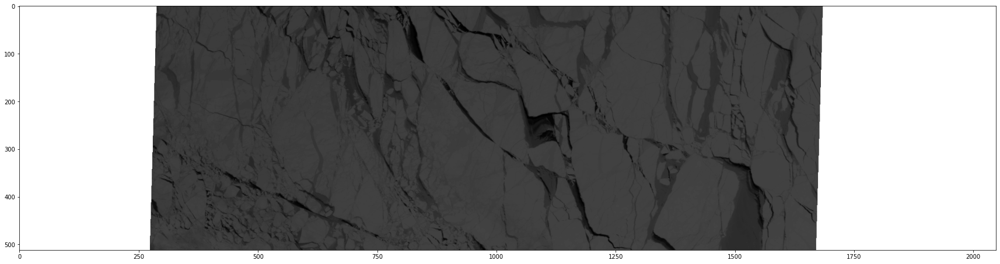

P=097, O=86904, B=22, points-per-pixel= 2.0


<Figure size 432x288 with 0 Axes>

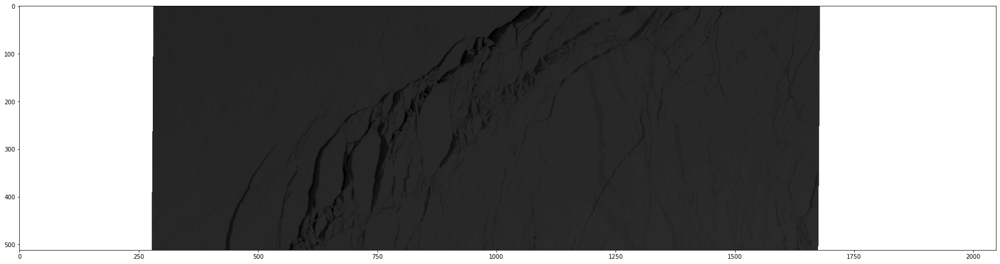

P=096, O=87035, B=20, points-per-pixel= 3.0


<Figure size 432x288 with 0 Axes>

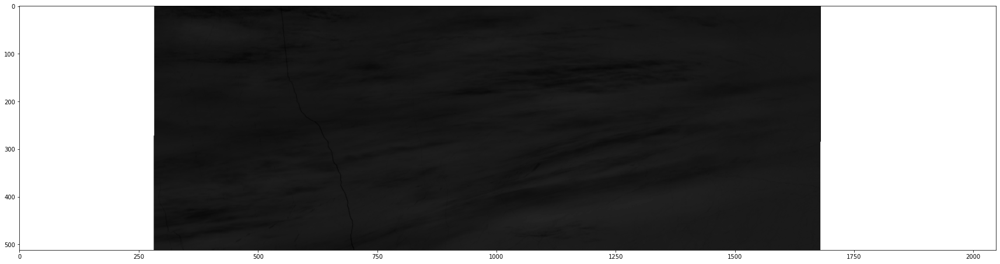

P=112, O=87036, B=17, points-per-pixel= 7.0


<Figure size 432x288 with 0 Axes>

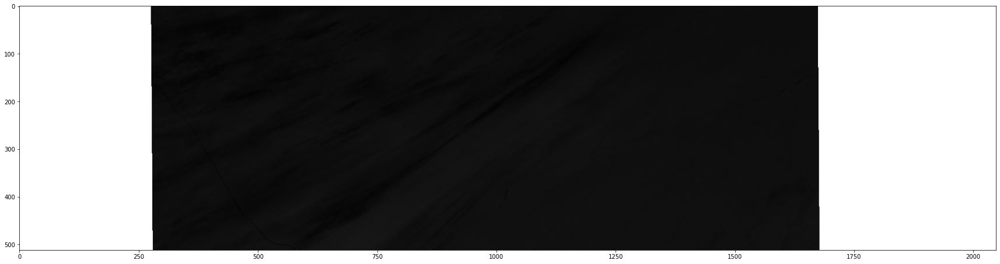

P=128, O=87037, B=14, points-per-pixel= 2.0


<Figure size 432x288 with 0 Axes>

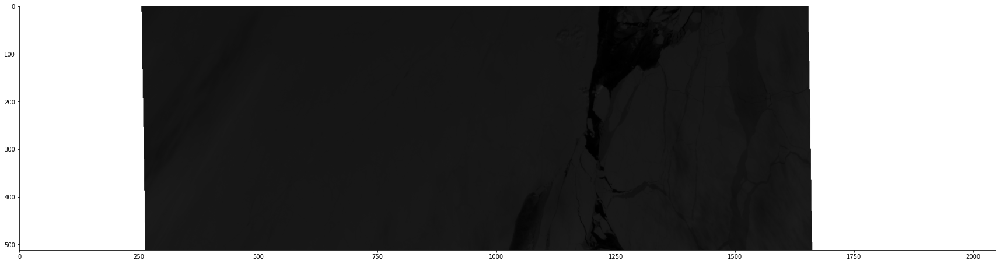

P=071, O=87048, B=24, points-per-pixel= 2.0


<Figure size 432x288 with 0 Axes>

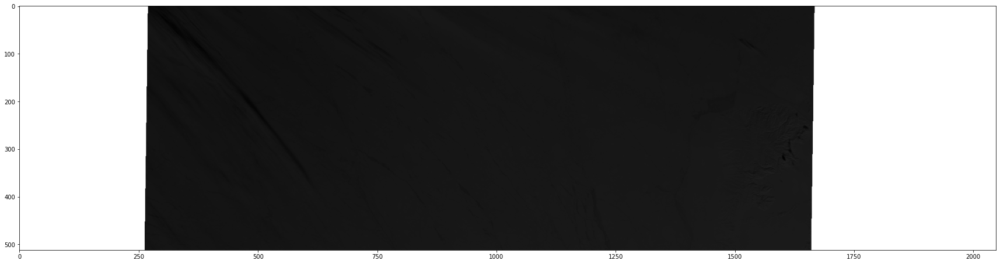

P=071, O=87048, B=30, points-per-pixel= 5.0


<Figure size 432x288 with 0 Axes>

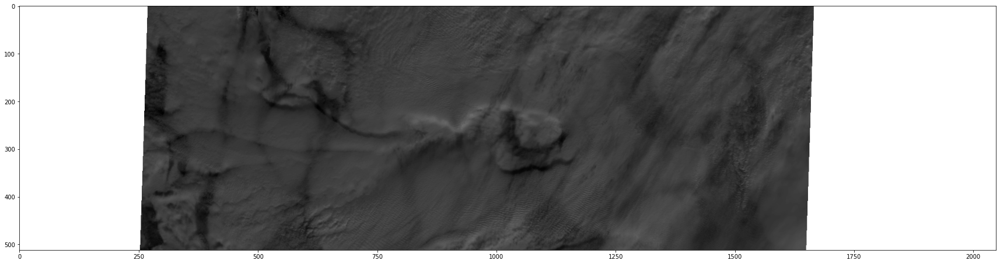

P=079, O=86932, B=33, points-per-pixel= 3.0


<Figure size 432x288 with 0 Axes>

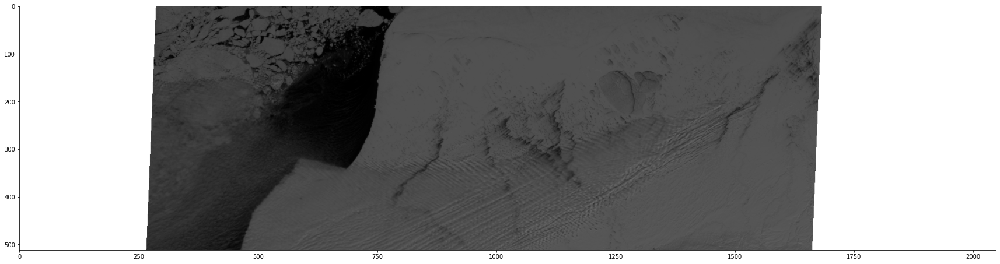

P=079, O=86932, B=28, points-per-pixel= 7.0


<Figure size 432x288 with 0 Axes>

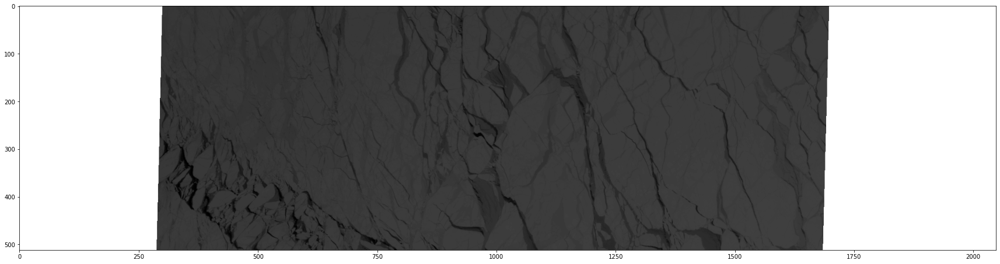

P=071, O=87048, B=25, points-per-pixel= 3.0


<Figure size 432x288 with 0 Axes>

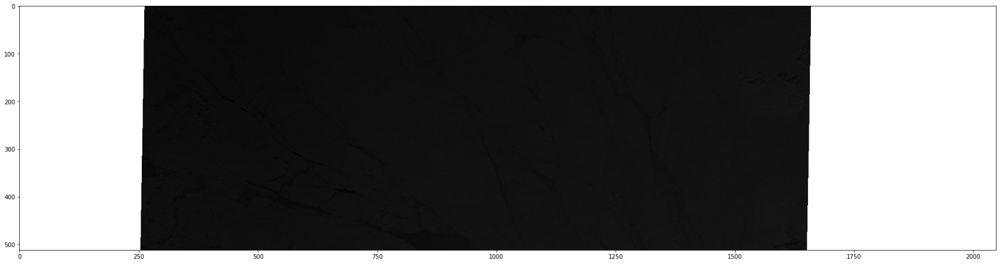

P=087, O=87049, B=22, points-per-pixel= 3.0


<Figure size 432x288 with 0 Axes>

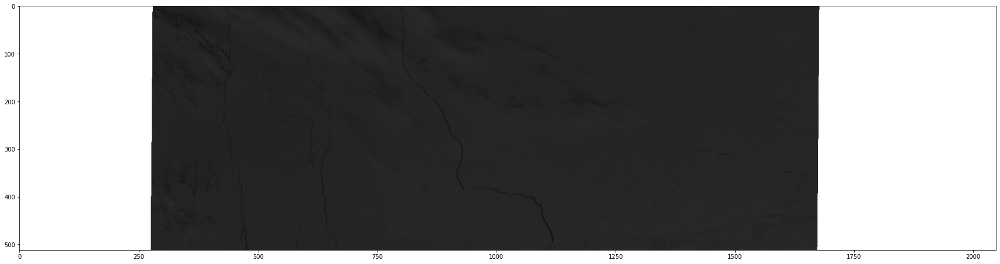

P=097, O=86904, B=24, points-per-pixel= 1.0


<Figure size 432x288 with 0 Axes>

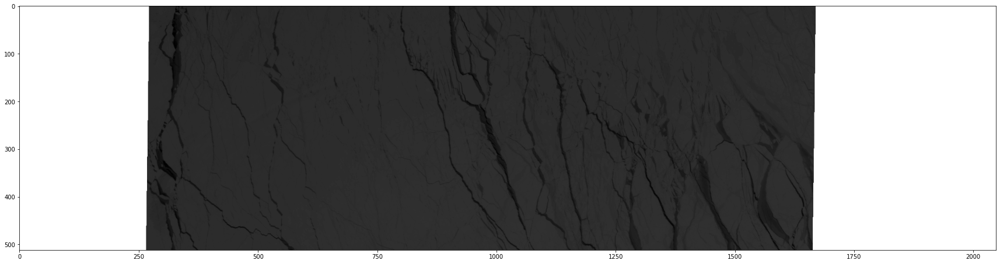

P=144, O=87038, B=8, points-per-pixel= 1.0


<Figure size 432x288 with 0 Axes>

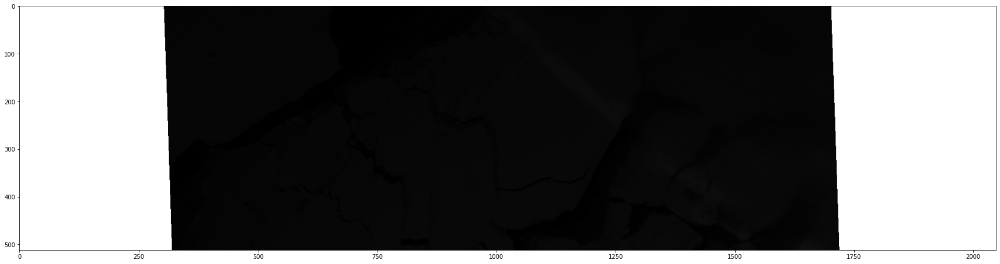

P=096, O=87035, B=18, points-per-pixel= 9.0


<Figure size 432x288 with 0 Axes>

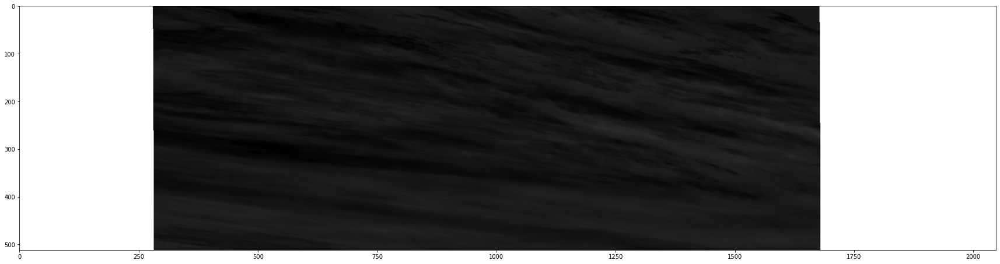

successfully printed 60 files!


In [11]:
for row_indx in range(pob_unique.shape[0]):
    
#     path_num = pob_unique['path'].iloc[row_indx]
#     orbit_num_str = str(pob_unique['orbit'].iloc[row_indx])
#     start_block = str(pob_unique['block'].iloc[row_indx])


    path_num = pob_unique['#path'].iloc[row_indx]
    orbit_num_str = str(pob_unique[' orbit'].iloc[row_indx])
    start_block = str(pob_unique[' img_block'].iloc[row_indx])
    n_points = pob_unique[' npts'].iloc[row_indx]

    
    end_block = start_block
    cam = "AN"
    
    if (path_num < 100):
        path_num_str = '0'+str(path_num)
    else:
        path_num_str = str(path_num)
    
    
    print('P=%s, O=%s, B=%s, points-per-pixel= %s' %(path_num_str, orbit_num_str, start_block, n_points))
    
    hdf_file = "MISR_AM1_GRP_ELLIPSOID_GM_P"+path_num_str+"_O0"+orbit_num_str+"_"+cam+"_F03_0024.hdf"
    
    hdf_file_fp = os.path.join(hdf_dir, hdf_file)
    hdf_file_stat = os.path.isfile(hdf_file_fp)
#     print(hdf_file_stat)
    if (hdf_file_stat==False):
        print('hdf file not found!')
        continue
        
    # open (allocate pointer) and read hdf file 
    input_hdf = MtkFile(hdf_file_fp)
    input_hdf.block
    r1 = MtkRegion(int(path_num), int(start_block), int(end_block))
    type(r1)
    redband_img = input_hdf.grid("RedBand").field("Red Radiance/RDQI").read(r1).data()
#     print('path: %s orbit: %s block: %s' %(path_num, orbit_num, start_block))
    plot_here_and_write(redband_img, hdf_dir, start_block, end_block)
    # need to close the hdf-file here?


print('successfully printed %s files!' %pob_unique.shape[0])


## what is this part?

In [ ]:
# start_time = '2016-04-26T00:00:00Z'
# end_time = '2016-04-26T23:23:59Z'

In [ ]:
# orbit_list = Mtk.time_range_to_orbit_list(start_time, end_time)
# orbit_list

In [ ]:
# # for each orbit...
# for orbit_no in orbit_list:
    
#     path_no = Mtk.orbit_to_path(orbit_no)
#     print(path_no)
    
#     start_block_init = 18
#     end_block_init = 46
        
#     cam = "AN"
    
#     hdf_file = "MISR_AM1_GRP_ELLIPSOID_GM_P"+str(path_no)+"_O0"+str(orbit_no)+"_"+cam+"_F03_0024.hdf"
#     print('P:%s O:%s B:%s' %(path_no, orbit_num, start_block_init))
    
#     hdf_file_fp = os.path.join(hdf_dir, hdf_file)
#     hdf_file_stat = os.path.isfile(hdf_file_fp)
    
# #     print(hdf_file_stat)
#     if (hdf_file_stat==False):
#         print('hdf file not found! continue')
#         continue
        
#     # open (allocate pointer) and read hdf file 
#     input_hdf = MtkFile(hdf_file_fp)
#     input_hdf.block
#     r2 = MtkRegion(int(path_no), int(start_block_init), int(end_block_init))
#     type(r2)
#     redband_img = input_hdf.grid("RedBand").field("Red Radiance/RDQI").read(r2).data()
#     print('path: %s orbit: %s block: %s' %(path_no, orbit_no, start_block_init))
    
#     # how find the path that covers Anne's paper?
#     # how check my location falls in that path? lat= 81.293096, lon= -95.022243
#     fav_loc_lat_lon = (81.293096, -95.022243)
#     bls = Mtk.latlon_to_bls(path_no, 275, fav_loc_lat_lon[0], fav_loc_lat_lon[1])
#     print('mtk bls:')
#     print(bls)
# #     start_block_single = bls[0]
# #     end_block_single = bls[0]
    
    
# #     plot_here_and_write(redband_img, hdf_dir, start_block_single, end_block_single)
#     plot_here_and_write(redband_img, hdf_dir, start_block_init, end_block_init)
    
    
# print('END')
    